In [1]:
import warnings
warnings.filterwarnings('ignore')

In [2]:
import pandas as pd
import numpy as np
from PIL import Image
import tensorflow as tf 

In [3]:
from tensorflow.keras.layers import Activation, MaxPooling2D, MaxPool2D, Dropout, Dense, Convolution2D, Conv2D, Flatten

In [4]:
from keras.preprocessing.image import ImageDataGenerator 

In [5]:
from tensorflow.keras.models import Sequential

In [6]:
from tensorflow.keras.callbacks import ModelCheckpoint

In [7]:
import matplotlib.pyplot as plt

In [8]:
import os
import glob

In [9]:
mild='datasets/train/mild'
moderate='datasets/train/moderate'
normal='datasets/train/normal'
severe='datasets/train/severe'

In [10]:
def plot_images(item_dir, n=6):
    all_item_dir = os.listdir(item_dir)
    item_files = [os.path.join(item_dir, file) for file in all_item_dir][:n]
    
    plt.figure(figsize=(80, 40))
    for idx, img_path in enumerate(item_files):
        plt.subplot(3, n, idx+1)
        img = plt.imread(img_path)
        plt.imshow(img, cmap='gray')
        plt.axis('off')
    
    plt.tight_layout()

In [11]:
def Images_details_Print_data(data, path):
    print(" ====== Images in: ", path)    
    for k, v in data.items():
        print("%s:\t%s" % (k, v))

def Images_details(path):
    files = [f for f in glob.glob(path + "**/*.*", recursive=True)]
    data = {}
    data['images_count'] = len(files)
    data['min_width'] = 10**100  # No image will be bigger than that
    data['max_width'] = 0
    data['min_height'] = 10**100  # No image will be bigger than that
    data['max_height'] = 0


    for f in files:
        im = Image.open(f)
        width, height = im.size
        data['min_width'] = min(width, data['min_width'])
        data['max_width'] = max(width, data['max_height'])
        data['min_height'] = min(height, data['min_height'])
        data['max_height'] = max(height, data['max_height'])

    Images_details_Print_data(data, path)


Trainned data for mild:

 ====== Images in:  datasets/train/mild
images_count:	350
min_width:	320
max_width:	320
min_height:	310
max_height:	320



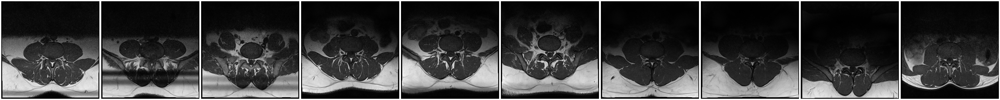

In [12]:
print("")
print("Trainned data for mild:")
print("")
Images_details(mild)
print("")
plot_images(mild, 10) 


Trainned data for moderate:

 ====== Images in:  datasets/train/moderate
images_count:	700
min_width:	320
max_width:	320
min_height:	310
max_height:	320



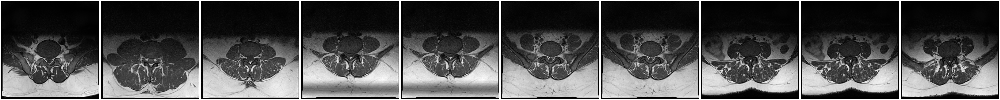

In [13]:
print("")
print("Trainned data for moderate:")
print("")
Images_details(moderate)
print("")
plot_images(moderate, 10) 


Trainned data for normal:

 ====== Images in:  datasets/train/normal
images_count:	593
min_width:	320
max_width:	320
min_height:	320
max_height:	320



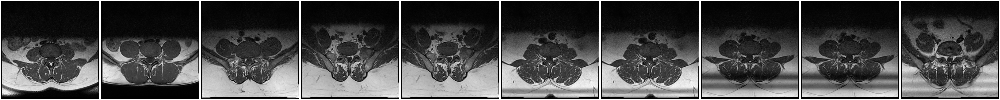

In [14]:
print("")
print("Trainned data for normal:")
print("")
Images_details(normal)
print("")
plot_images(normal, 10) 


Trainned data for severe:

 ====== Images in:  datasets/train/severe
images_count:	340
min_width:	320
max_width:	320
min_height:	310
max_height:	320



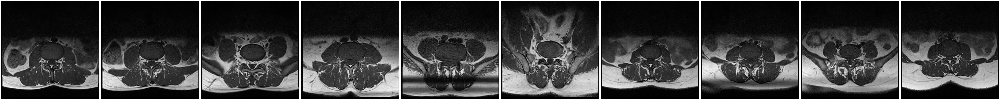

In [15]:
print("")
print("Trainned data for severe:")
print("")
Images_details(severe)
print("")
plot_images(severe, 10) 

In [16]:
train_datagen=ImageDataGenerator(rescale=1./255,shear_range=0.2,zoom_range=0.2,horizontal_flip=True)
training_set=train_datagen.flow_from_directory('datasets/train',target_size=(256,256),batch_size=32,class_mode='categorical')

Found 1983 images belonging to 4 classes.


In [17]:
train_datagen=ImageDataGenerator(rescale=1./255,shear_range=0.2,zoom_range=0.2,horizontal_flip=True)
test_set=train_datagen.flow_from_directory('datasets/test',target_size=(256,256),batch_size=32,class_mode='categorical')

Found 2138 images belonging to 4 classes.


In [18]:
Classifier=Sequential()
Classifier.add(Convolution2D(32,(3,3),input_shape=(256,256,3),activation='relu'))
Classifier.add(MaxPooling2D(pool_size=(2,2)))
Classifier.add(Flatten())
Classifier.add(Dense(38, activation='relu'))
Classifier.add(Dense(4, activation='softmax'))
Classifier.compile(optimizer='rmsprop',loss='categorical_crossentropy',metrics=['accuracy'])

In [19]:
epochs = 10
batch_size = 64

In [ ]:
#### Fitting the model
history = Classifier.fit(
           training_set, steps_per_epoch=training_set.samples // batch_size, 
           epochs=epochs, 
           validation_data=test_set,validation_steps=test_set.samples // batch_size)

Epoch 1/10


30/30 [==============================] - ETA: 0s - loss: 8.3739 - accuracy: 0.2729  

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

plt.figure(figsize=(20, 8))
plt.plot(history.history['accuracy'])

for i in range(epochs):
    if i%5 == 0:
        plt.annotate(np.round(history.history['accuracy'][i]*100,2),xy=(i,history.history['accuracy'][i]))

plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.show()

In [ ]:
plt.figure(figsize=(20, 8))
plt.plot(history.history['loss'])

for i in range(epochs):
    if i%5 == 0:
        plt.annotate(np.round(history.history['loss'][i]*100,2),xy=(i,history.history['loss'][i]))

plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.show()